In [1]:
import sys
sys.path.append('..')
from scipy import stats
import numpy as np
import pandas as pd
import random
import seaborn as sns
import matplotlib.pyplot as plt
from nestedness_calculator import NestednessCalculator
import vis_function as vf
import warnings
import scipy.stats
import os
from copy import deepcopy as dc
import matplotlib.pyplot as plt
import json


warnings.filterwarnings('ignore')

def nestedness(fr_df, label):
    unique_fr = []
    for i in range(fr_df.shape[0]):
        for j in range(i+1, fr_df.shape[0]):
            if fr_df.iloc[i, j] > 0:
                unique_fr.append(fr_df.iloc[i,j])
    if len(unique_fr) > 2:
        p_value = scipy.stats.normaltest(unique_fr)[1]
        #print("p_value is {}, normal {}".format(p_value, p_value>0.05))
    xtitle = 'distribution of lCFR ({})'.format(label)
    vf.fr_frequency(fr_df.values, xtitle)
    miu = np.mean(unique_fr)
    sigma = np.std(unique_fr)
    vf.heatmap_fr_continue(fr_df, 'lCFR matrix ({})'.format(label))
    binary_df = vf.heatmap_fr_binary(fr_df, 'binary matrix ({})'.format(label), 0.6)
    nested_nodf_score = NestednessCalculator(binary_df.values).nodf(binary_df.values)
    print("{} NODF = {}".format(label, nested_nodf_score))

    # NULL model 100 times
    a=stats.norm.rvs(miu,sigma,size=len(unique_fr))
    scores = []
    for i in range(100):
        pos_list=random.sample(list(range(0, int((fr_df.shape[0]**2-fr_df.shape[0])/2))), len(unique_fr))
        pos_list.sort()
        empty = np.zeros(shape = fr_df.shape)
        pos_idx = 0
        idx = 0
        for i in range(empty.shape[0]):
            if pos_idx == len(pos_list):
                break
            for j in range(i+1, empty.shape[0]):
                if pos_idx == len(pos_list):
                    break
                elif idx == pos_list[pos_idx]:
                    empty[i][j] = a[pos_idx]
                    pos_idx += 1
                idx += 1 
        empty += empty.T
        row, col = np.diag_indices_from(empty)
        empty[row, col] = 1
        empty_df = pd.DataFrame(empty)
        binary_empty = vf.cutoff_matrix(empty_df, 0.6)
        nodf_score = NestednessCalculator(binary_empty.values).nodf(binary_empty.values)
        scores.append(nodf_score)

    # visualize the last null model
    vf.heatmap_fr_continue(empty_df, 'null model ({})'.format(label))
    vf.heatmap_fr_binary(empty_df, 'null model binary ({})'.format(label), 0.6)
    print("{} last null model NODF = {}".format(label, nodf_score))
    t, p = scipy.stats.ttest_1samp(scores, nested_nodf_score)
    print("{} p value = {}".format(label, p))
    return scores, nested_nodf_score, p

In [2]:
input_dir = '../result/pheno_result'
fr_dict = {}
for disease in os.listdir(input_dir):
    fr_dict[disease] = {}
    disease_dir = os.path.join(input_dir, disease)
    for cohort in os.listdir(disease_dir):
        fr_dict[disease][cohort] = {}
        cdir = os.path.join(disease_dir, cohort, 'sp')
        for pheno in os.listdir(cdir):
            fr = pd.read_csv(os.path.join(cdir, pheno, 'layer_0', 'fr.tsv'), sep='\t', header=0, index_col=0)
            pheno = pheno.split('_')[-1]
            # result\pheno_result\Adenoma\Adenoma1\sp\cluster_Adenoma\layer_0\fr.tsv
            fr_dict[disease][cohort][pheno] = dc(fr)
            

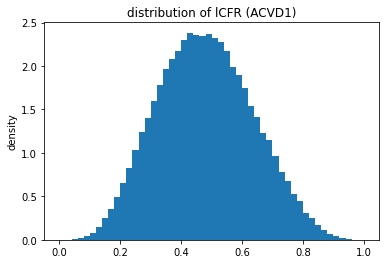

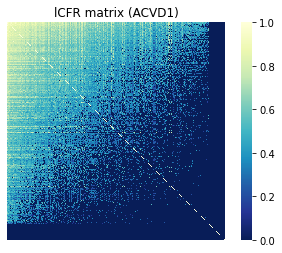

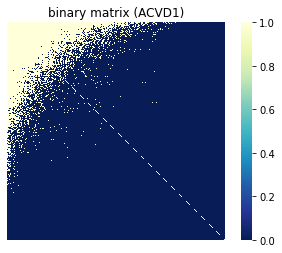

ACVD1 NODF = 0.4394791907327569


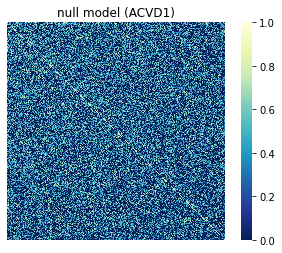

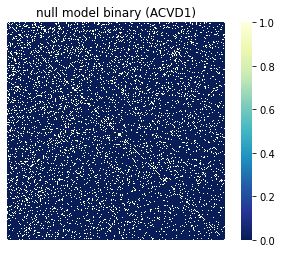

ACVD1 last null model NODF = 0.11564626660182521
ACVD1 p value = 6.424100466477255e-303


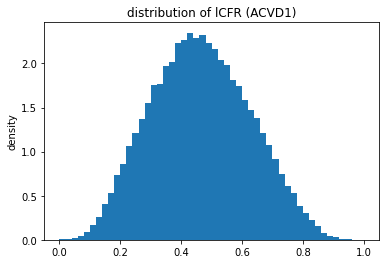

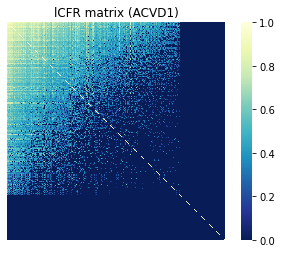

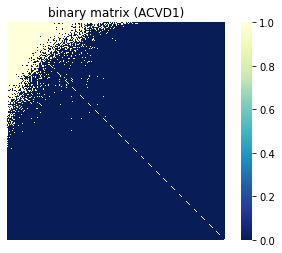

ACVD1 NODF = 0.25822184310127366


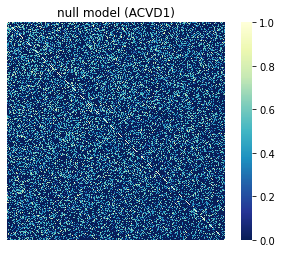

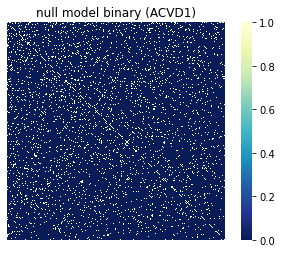

ACVD1 last null model NODF = 0.0743545912396826
ACVD1 p value = 1.697954382726724e-279


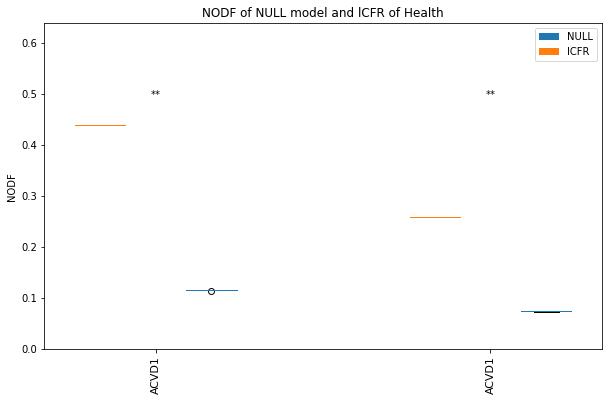

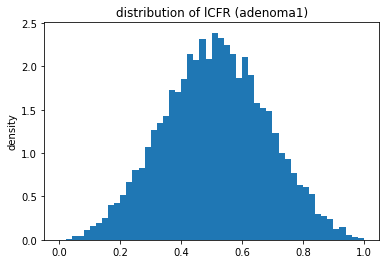

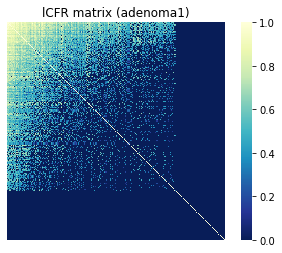

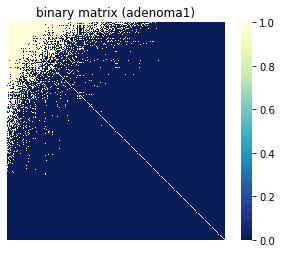

adenoma1 NODF = 0.2856989618616958


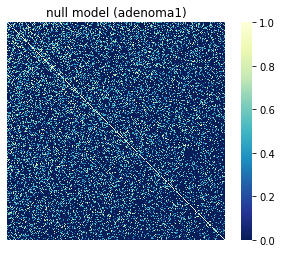

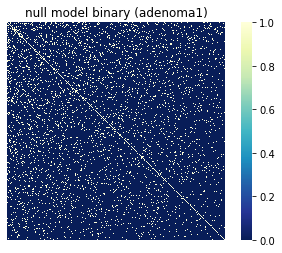

adenoma1 last null model NODF = 0.08650882580858844
adenoma1 p value = 1.017665006010742e-230


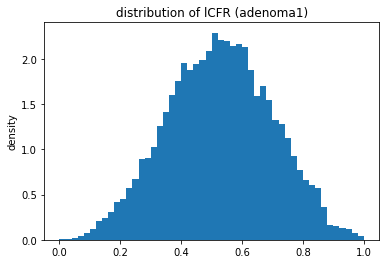

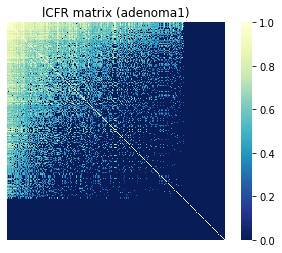

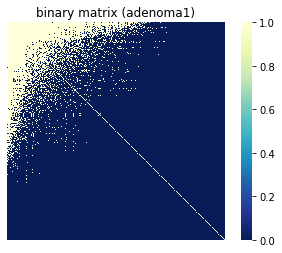

adenoma1 NODF = 0.3500712840830968


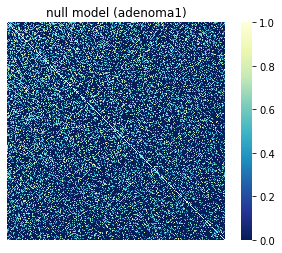

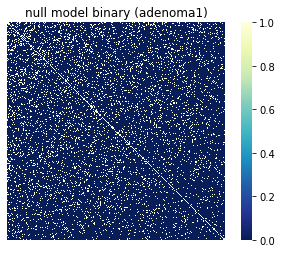

adenoma1 last null model NODF = 0.11548936917925694
adenoma1 p value = 4.0313612338383955e-234


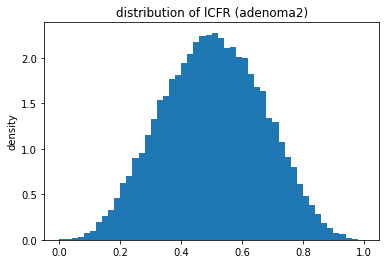

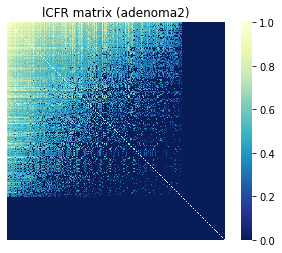

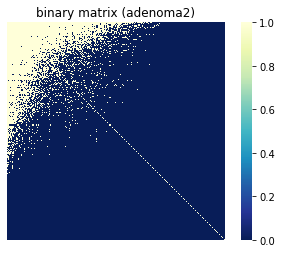

adenoma2 NODF = 0.3653143376609613


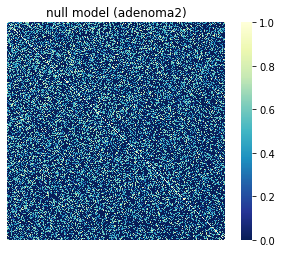

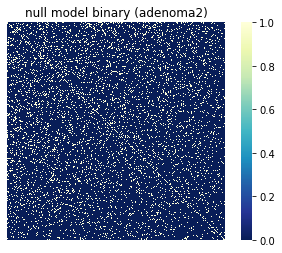

adenoma2 last null model NODF = 0.1135007461228947
adenoma2 p value = 1.5695219945996863e-275


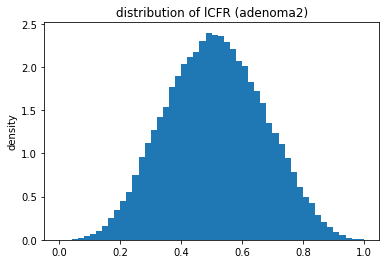

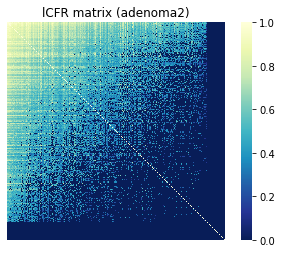

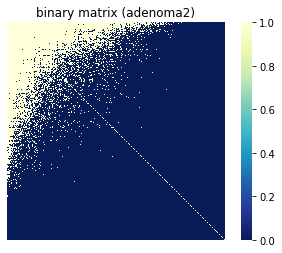

adenoma2 NODF = 0.495520388596846


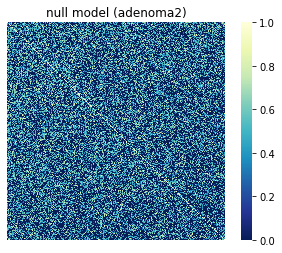

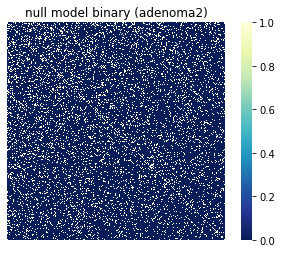

adenoma2 last null model NODF = 0.14526584965735115
adenoma2 p value = 1.2774092876021581e-285


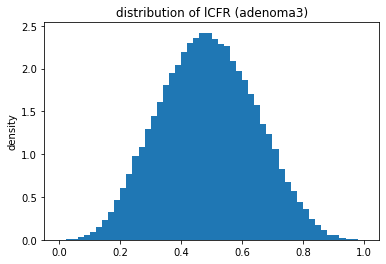

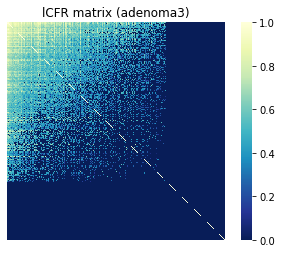

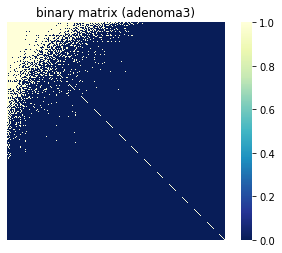

adenoma3 NODF = 0.26664607354939246


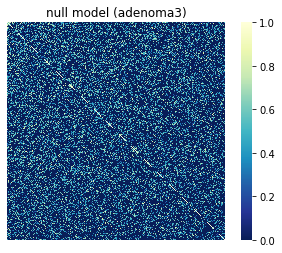

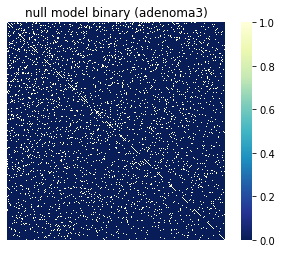

adenoma3 last null model NODF = 0.07415804848514018
adenoma3 p value = 9.935678848678797e-275


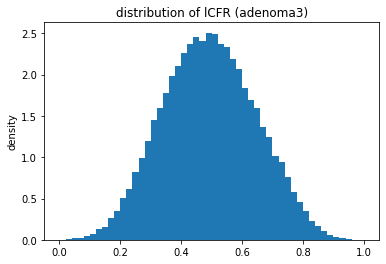

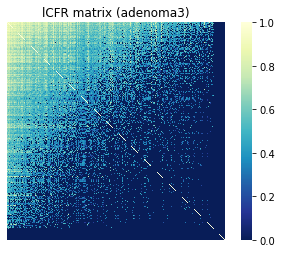

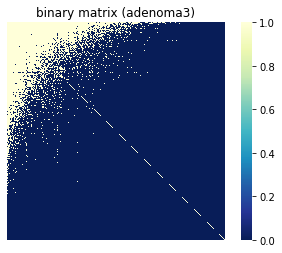

adenoma3 NODF = 0.4254695693098973


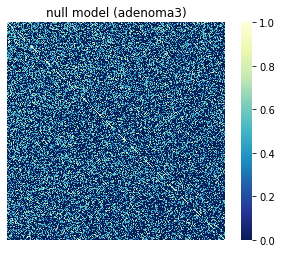

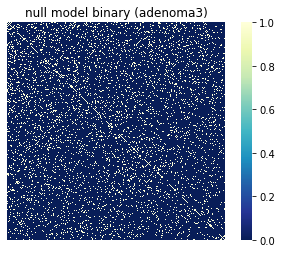

adenoma3 last null model NODF = 0.10716129746204546
adenoma3 p value = 1.0698282933925431e-293


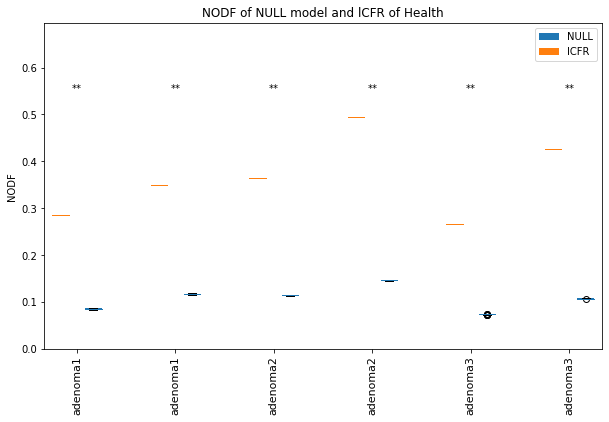

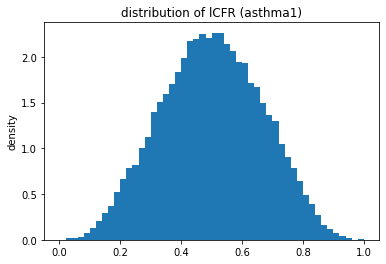

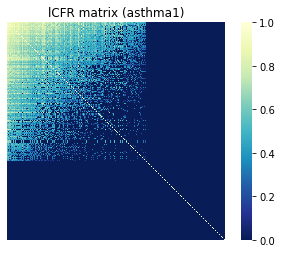

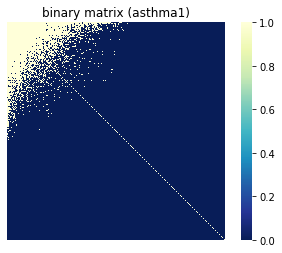

asthma1 NODF = 0.22499585146152035


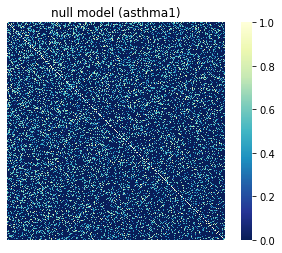

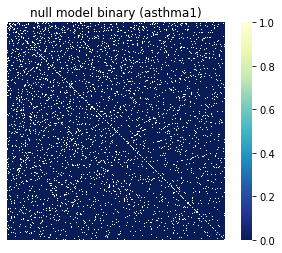

asthma1 last null model NODF = 0.07239078100292584
asthma1 p value = 8.873435449744383e-260


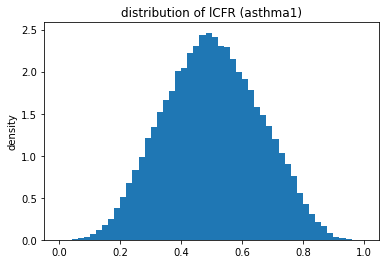

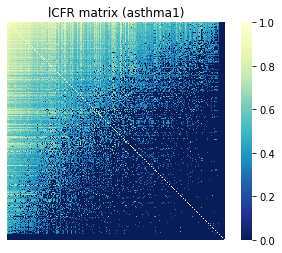

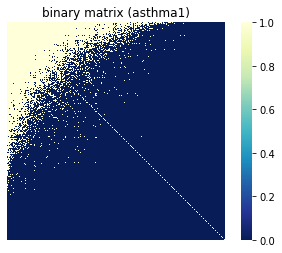

asthma1 NODF = 0.4964679054365476


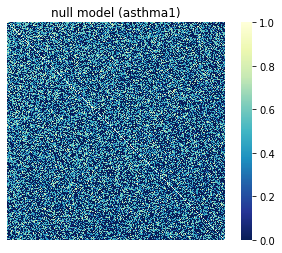

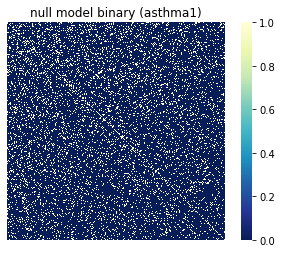

asthma1 last null model NODF = 0.14144932663284074
asthma1 p value = 4.312457419203281e-290


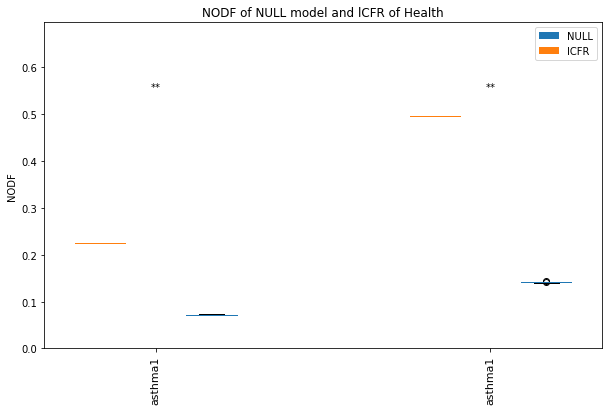

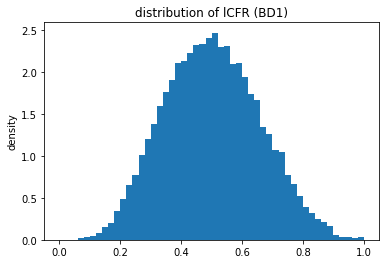

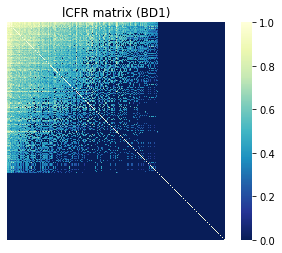

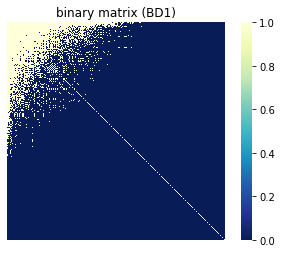

BD1 NODF = 0.2617550749910545


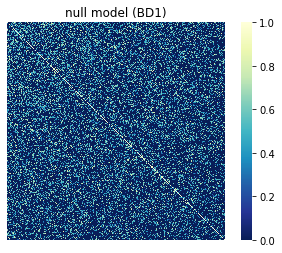

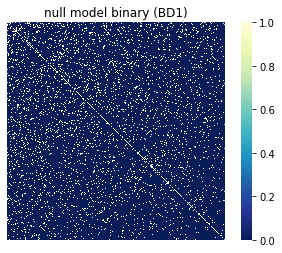

BD1 last null model NODF = 0.08583184025924612
BD1 p value = 3.7292787014707585e-242


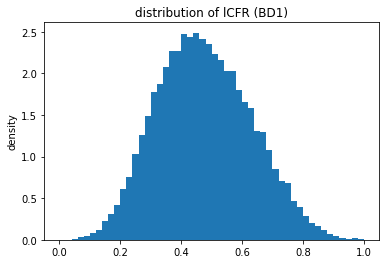

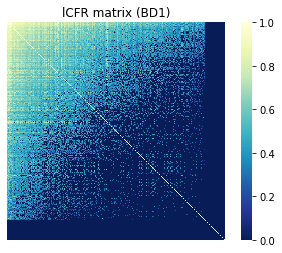

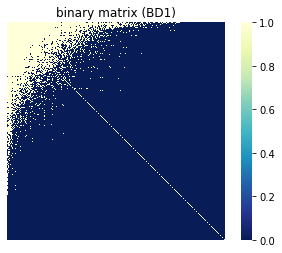

BD1 NODF = 0.4043770432652222


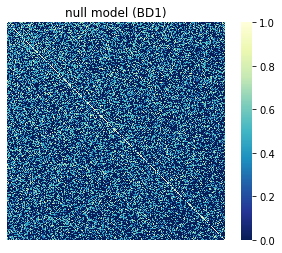

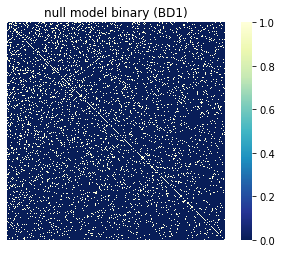

BD1 last null model NODF = 0.09951218727689824
BD1 p value = 8.820602129521722e-262


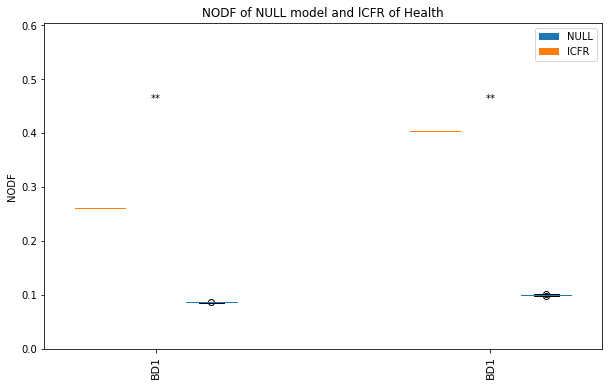

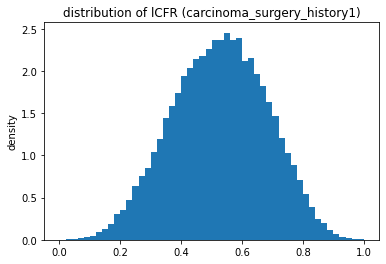

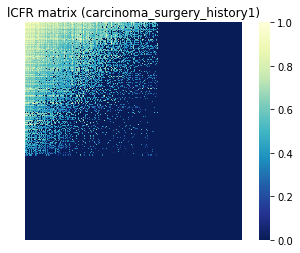

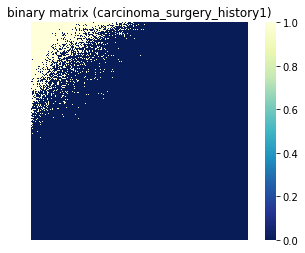

carcinoma_surgery_history1 NODF = 0.19562717834267832


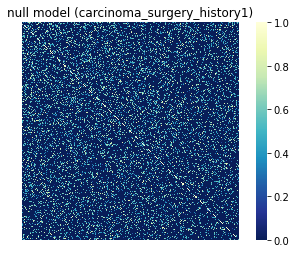

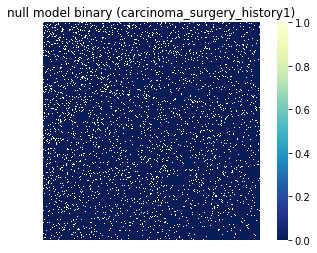

carcinoma_surgery_history1 last null model NODF = 0.06603543493241364
carcinoma_surgery_history1 p value = 1.1482745835569115e-259


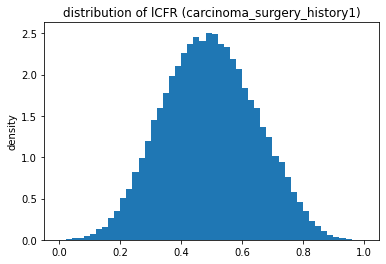

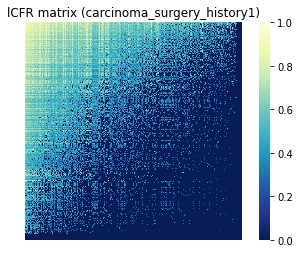

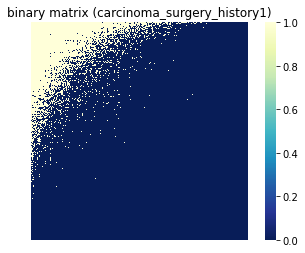

carcinoma_surgery_history1 NODF = 0.4477672880584917


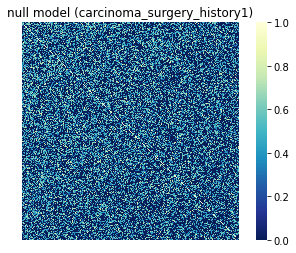

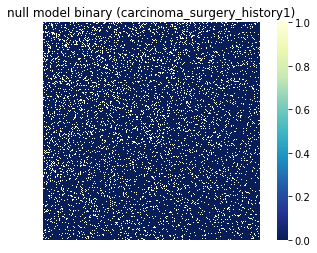

carcinoma_surgery_history1 last null model NODF = 0.11310016948776919
carcinoma_surgery_history1 p value = 8.25658413832128e-290


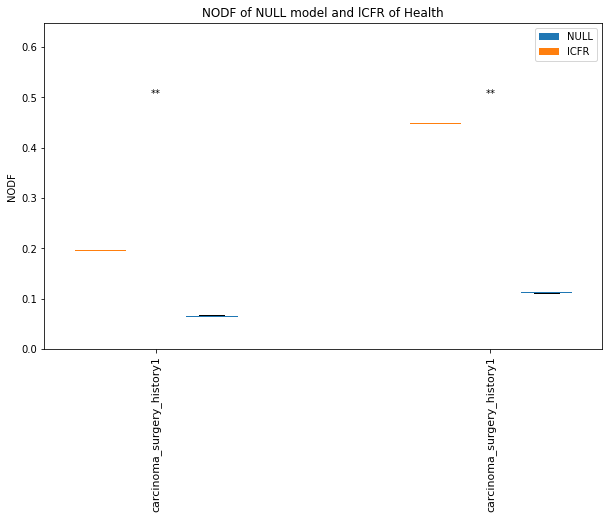

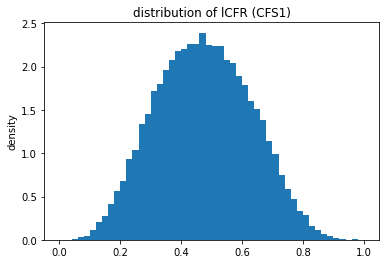

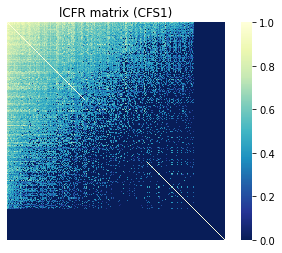

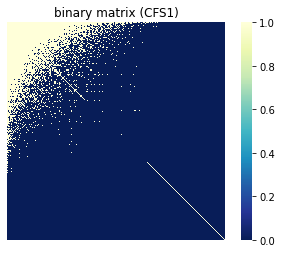

CFS1 NODF = 0.3359241733614088


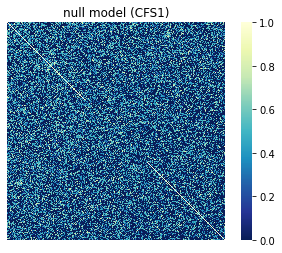

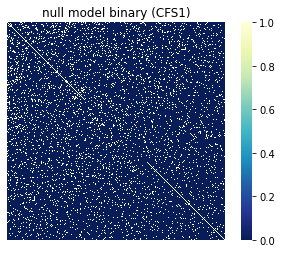

CFS1 last null model NODF = 0.09487752706461518
CFS1 p value = 1.461754477868896e-268


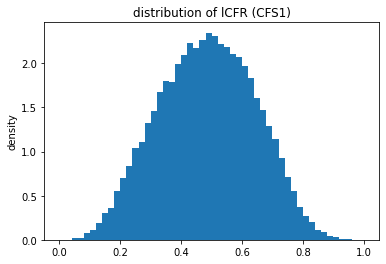

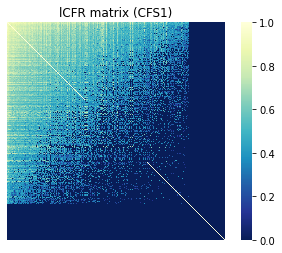

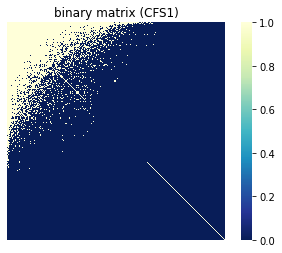

CFS1 NODF = 0.3587243998960109


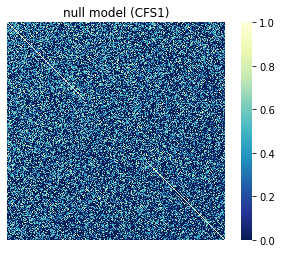

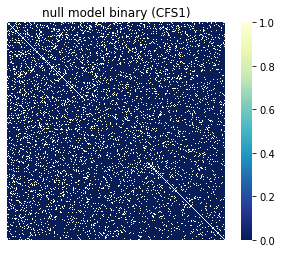

CFS1 last null model NODF = 0.1143815929695522
CFS1 p value = 8.212571617520203e-263


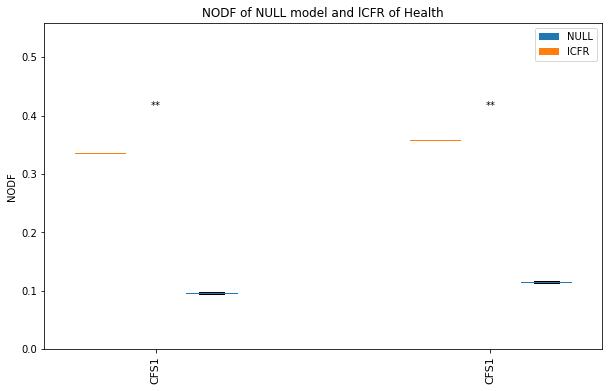

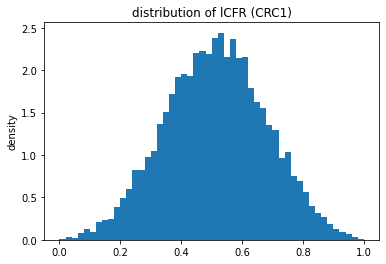

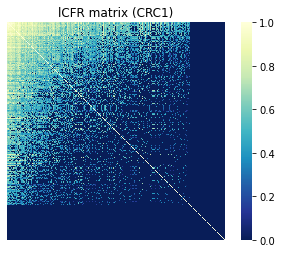

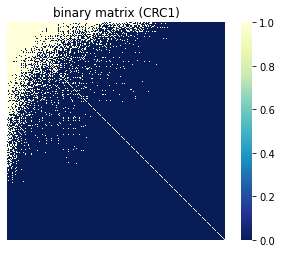

CRC1 NODF = 0.3274767078455598


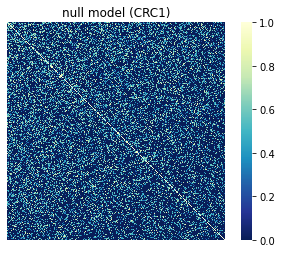

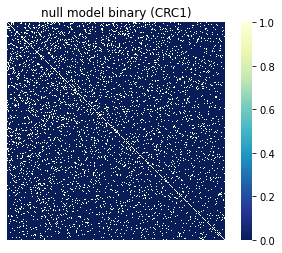

CRC1 last null model NODF = 0.09926691926410948
CRC1 p value = 1.396555273678688e-233


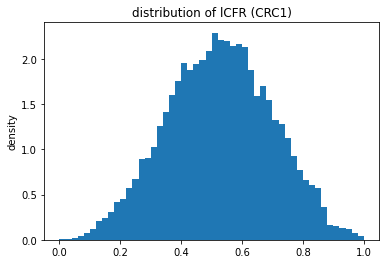

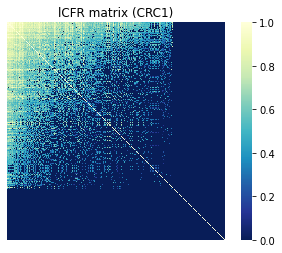

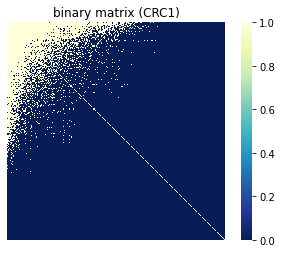

CRC1 NODF = 0.3086963597285741


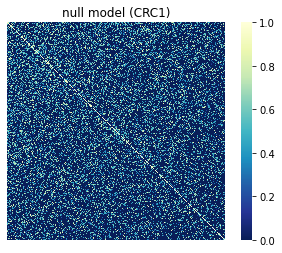

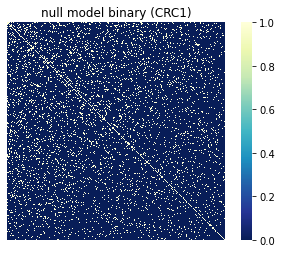

CRC1 last null model NODF = 0.10134033490482638
CRC1 p value = 1.2099863743871959e-236


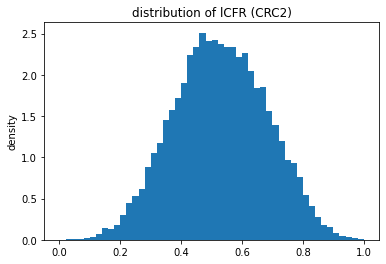

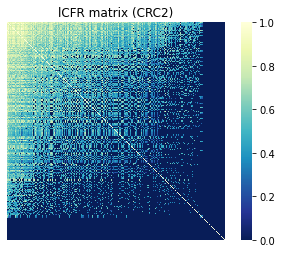

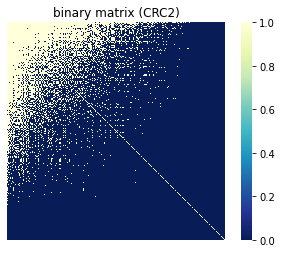

CRC2 NODF = 0.41799435534075063


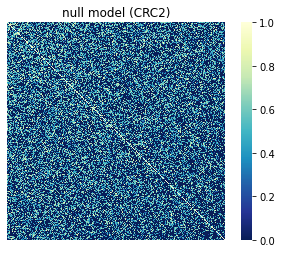

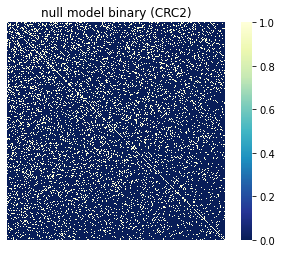

CRC2 last null model NODF = 0.14852113827450145
CRC2 p value = 2.0100813272060323e-248


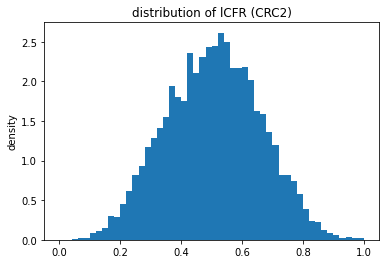

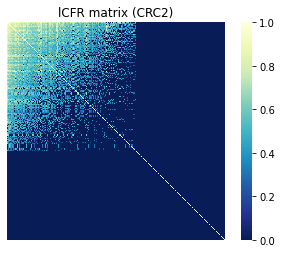

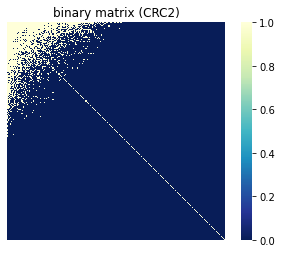

CRC2 NODF = 0.17200965619191577


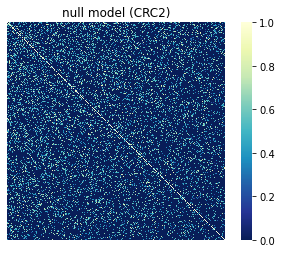

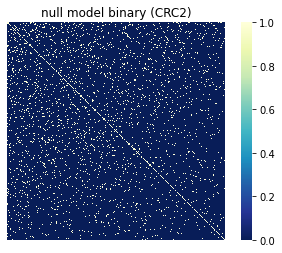

CRC2 last null model NODF = 0.05724759076989005
CRC2 p value = 8.894552383372802e-227


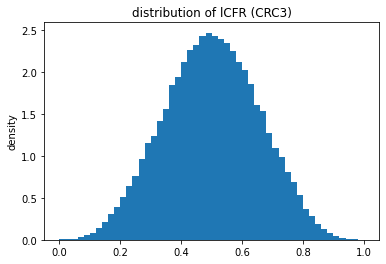

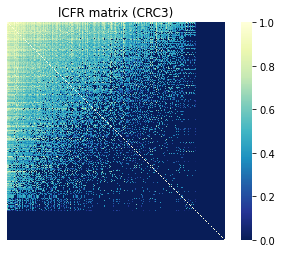

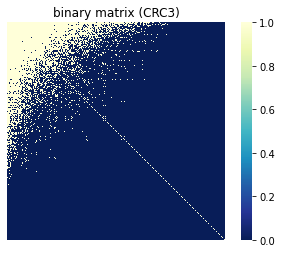

CRC3 NODF = 0.37627010528961424


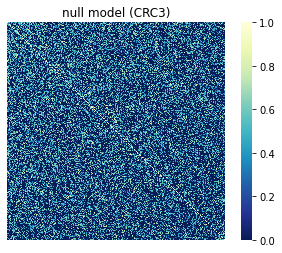

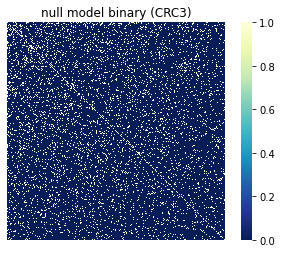

CRC3 last null model NODF = 0.11031363136879285
CRC3 p value = 4.287653038154282e-275


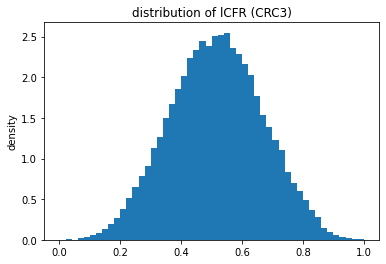

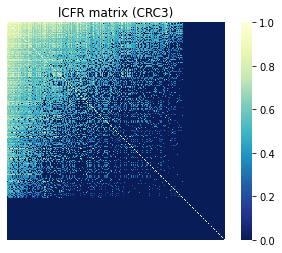

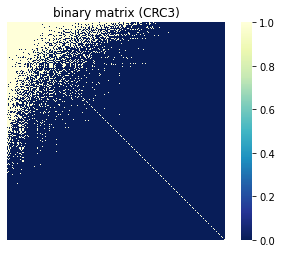

CRC3 NODF = 0.3548345234959814


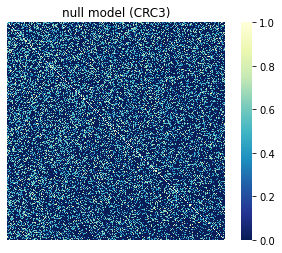

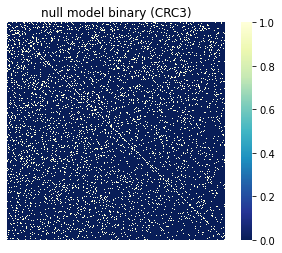

CRC3 last null model NODF = 0.10214943830223748
CRC3 p value = 1.9124018444474176e-279


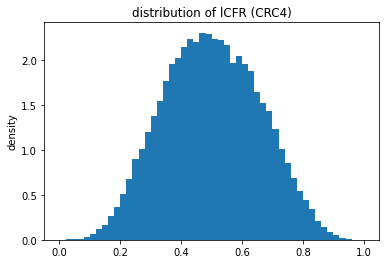

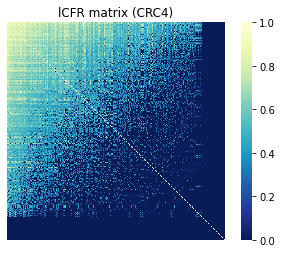

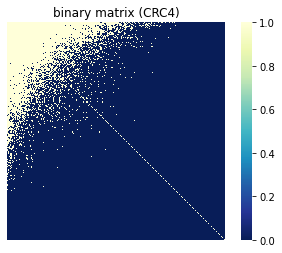

CRC4 NODF = 0.421583106986269


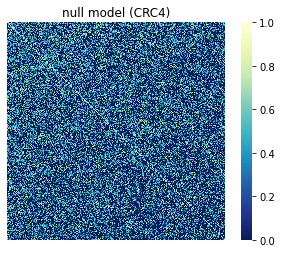

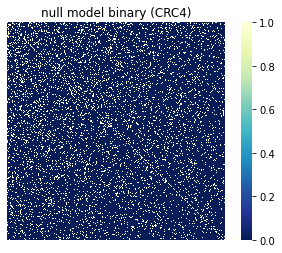

CRC4 last null model NODF = 0.12178649939581579
CRC4 p value = 4.0072462527007386e-284


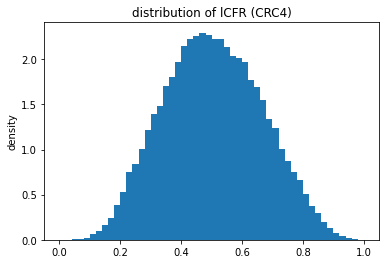

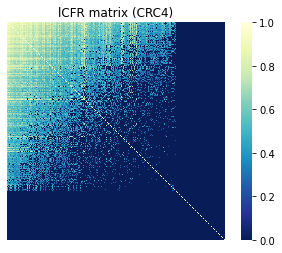

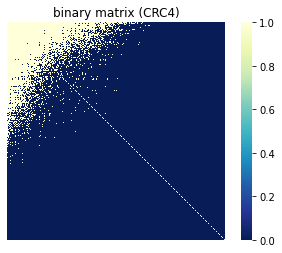

CRC4 NODF = 0.3095905069675584


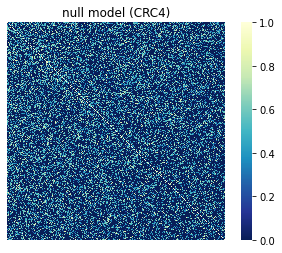

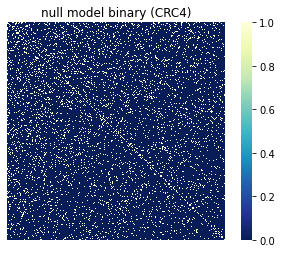

CRC4 last null model NODF = 0.10107314580517403
CRC4 p value = 1.7253458749814121e-271


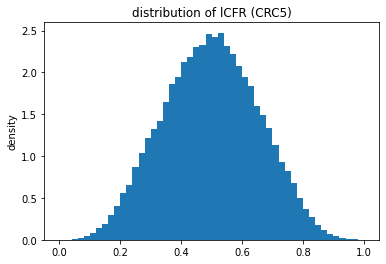

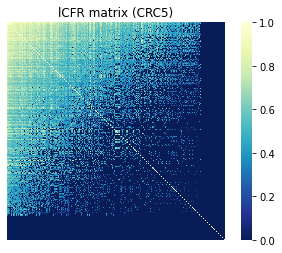

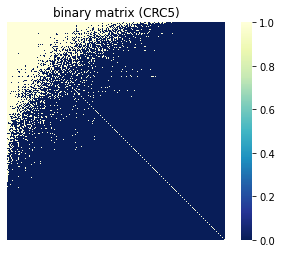

CRC5 NODF = 0.407950573482408


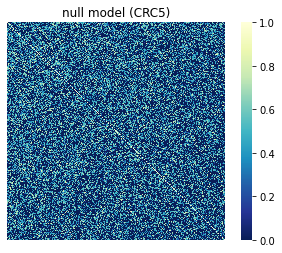

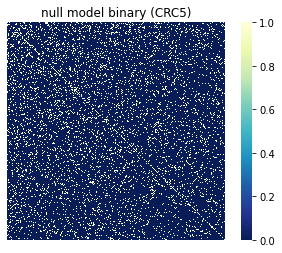

CRC5 last null model NODF = 0.11896416171402979
CRC5 p value = 1.8247213307934174e-276


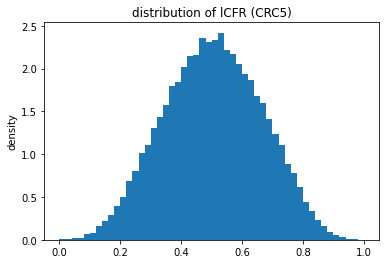

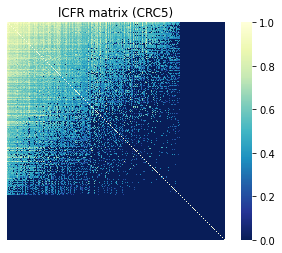

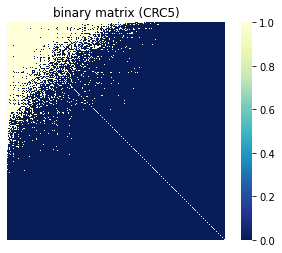

CRC5 NODF = 0.3493615636738465


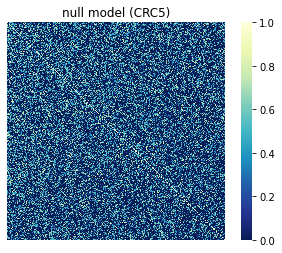

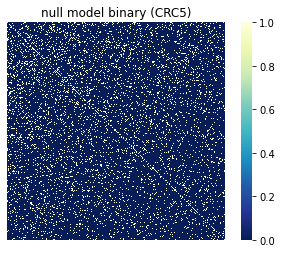

CRC5 last null model NODF = 0.11207841980704145
CRC5 p value = 7.398444955579288e-271


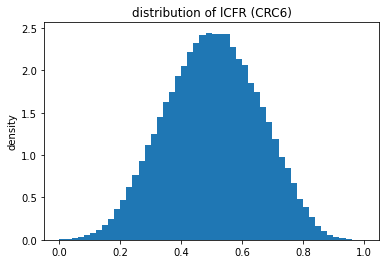

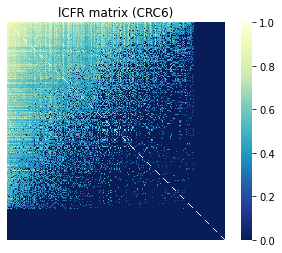

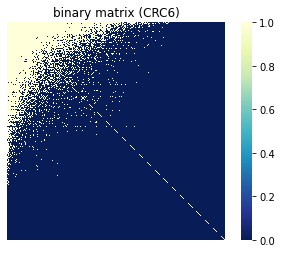

CRC6 NODF = 0.38307077331541817


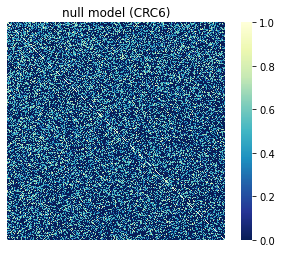

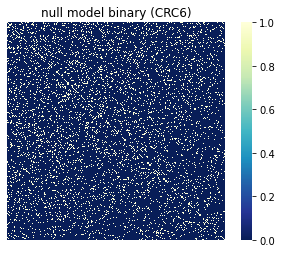

CRC6 last null model NODF = 0.11248670145627686
CRC6 p value = 1.8657929012898456e-287


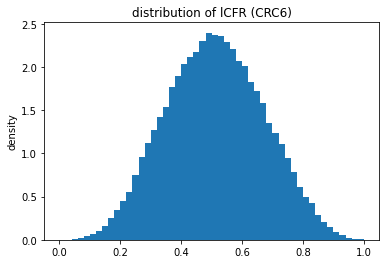

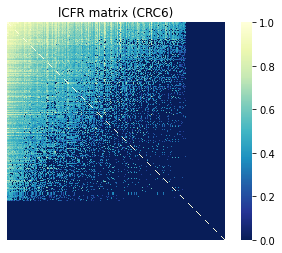

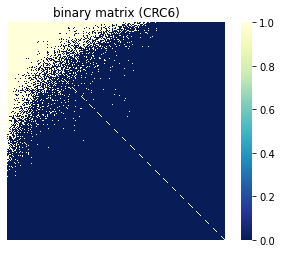

CRC6 NODF = 0.3978854575887161


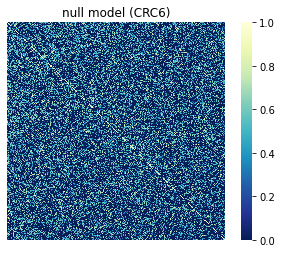

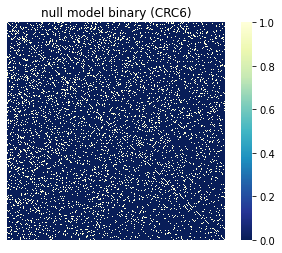

CRC6 last null model NODF = 0.1171861963839086
CRC6 p value = 2.3162200036840623e-283


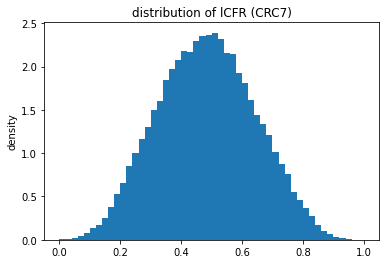

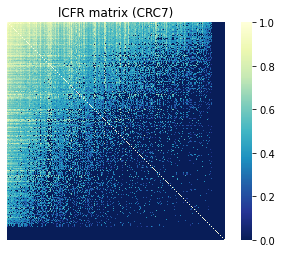

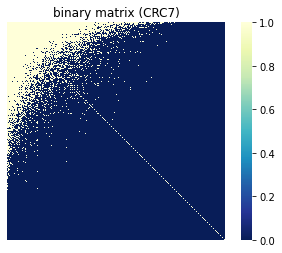

CRC7 NODF = 0.43172884100221154


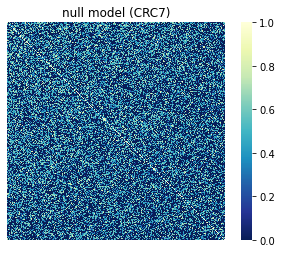

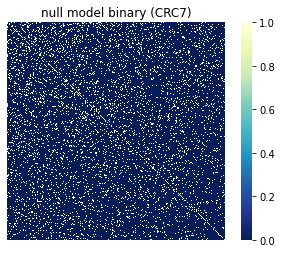

CRC7 last null model NODF = 0.11631591473110688
CRC7 p value = 1.2358520242464678e-283


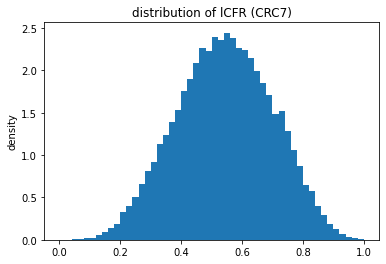

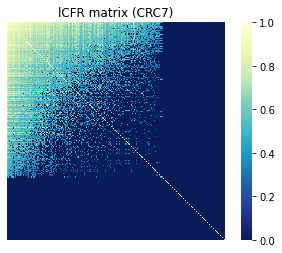

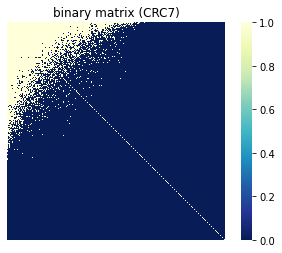

CRC7 NODF = 0.31479058526525727


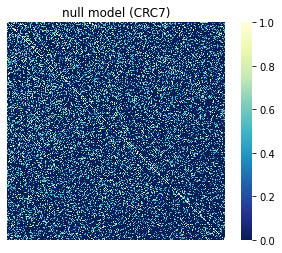

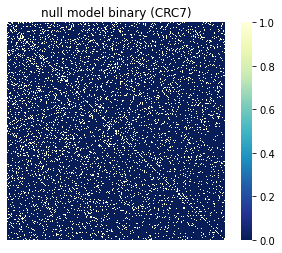

CRC7 last null model NODF = 0.10659284145053487
CRC7 p value = 1.4388796148046094e-268


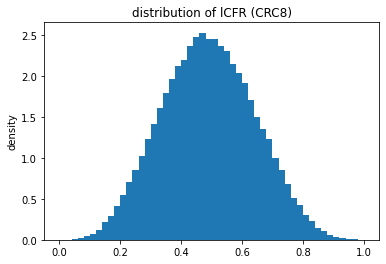

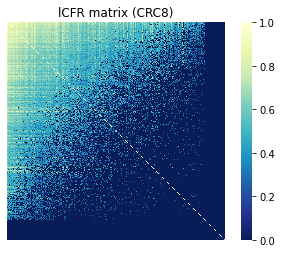

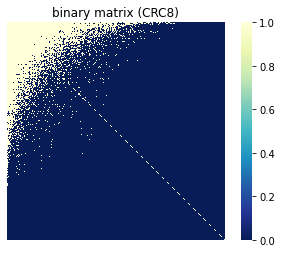

CRC8 NODF = 0.4123454731880865


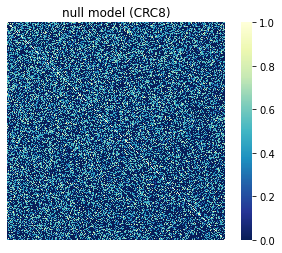

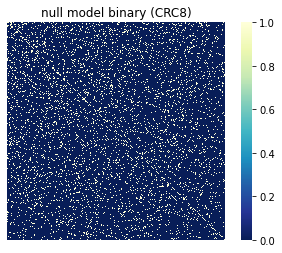

CRC8 last null model NODF = 0.10187615982329602
CRC8 p value = 7.378255902697355e-293


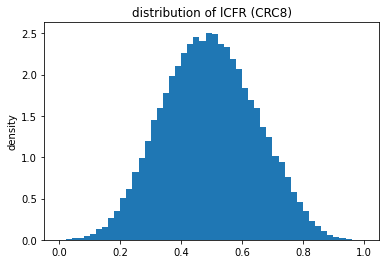

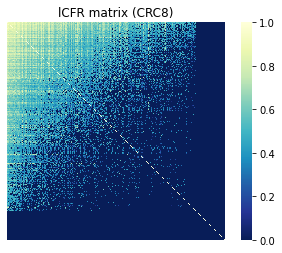

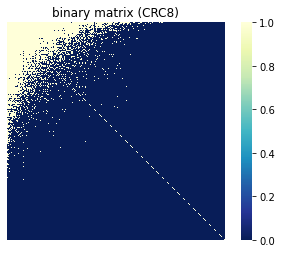

CRC8 NODF = 0.35615478354660524


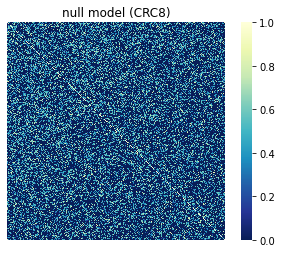

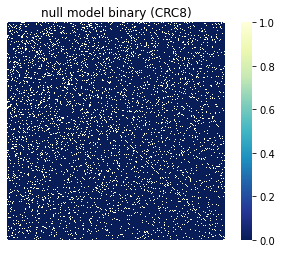

CRC8 last null model NODF = 0.09161572921748862
CRC8 p value = 5.9362341342429695e-298


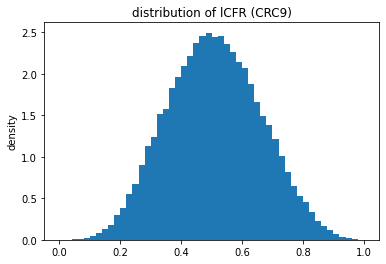

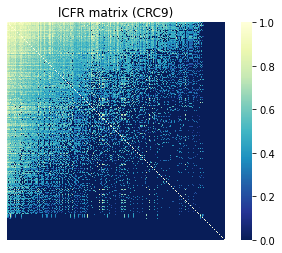

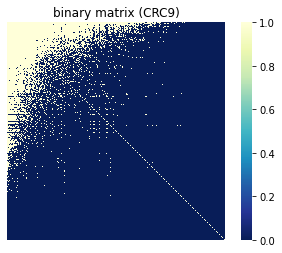

CRC9 NODF = 0.43378765753560833


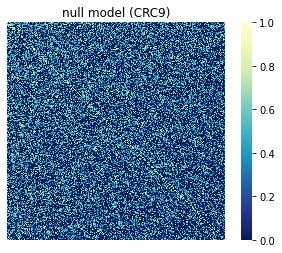

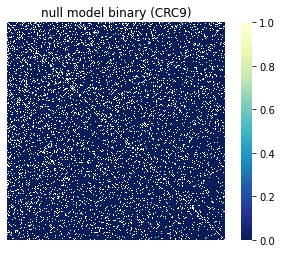

CRC9 last null model NODF = 0.1193082642644974
CRC9 p value = 4.250712849980612e-283


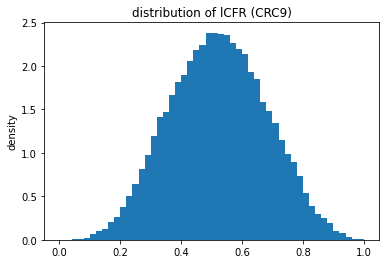

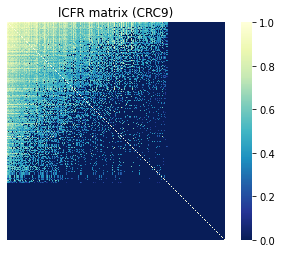

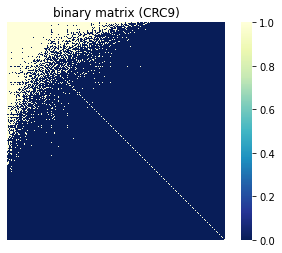

CRC9 NODF = 0.3383841239554988


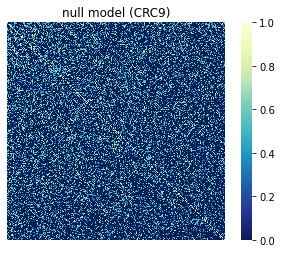

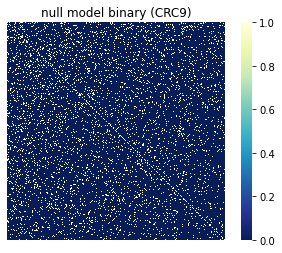

CRC9 last null model NODF = 0.09767248552978786
CRC9 p value = 2.4921331020725386e-278


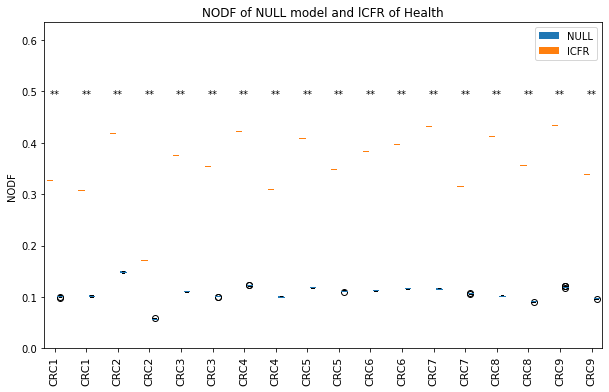

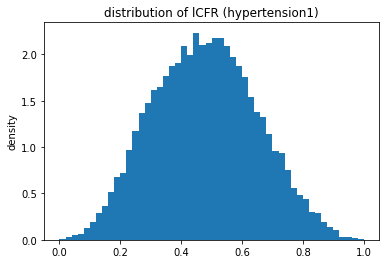

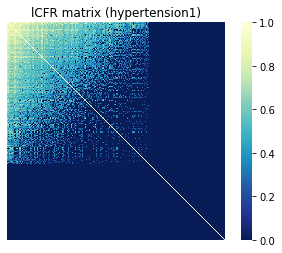

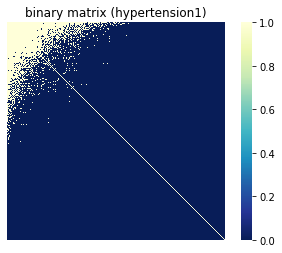

hypertension1 NODF = 0.21342693379694352


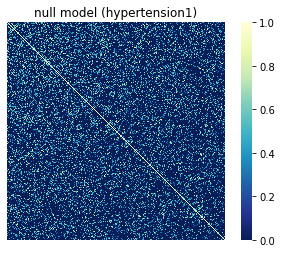

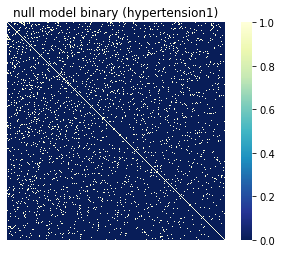

hypertension1 last null model NODF = 0.06248228563306824
hypertension1 p value = 1.4411138864371905e-251


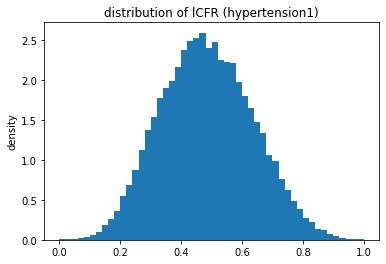

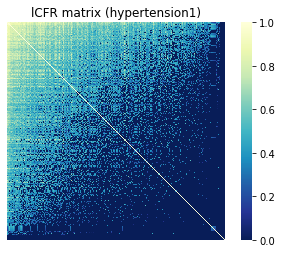

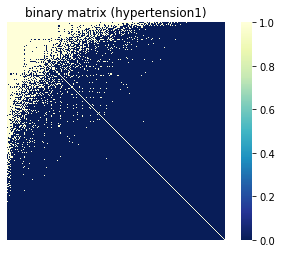

hypertension1 NODF = 0.45039785819308503


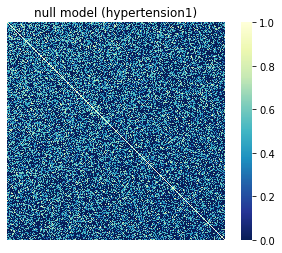

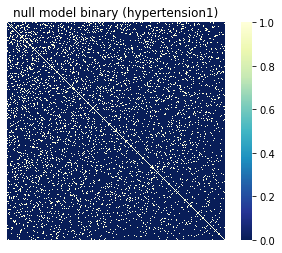

hypertension1 last null model NODF = 0.11037634033871037
hypertension1 p value = 5.090391634070303e-284


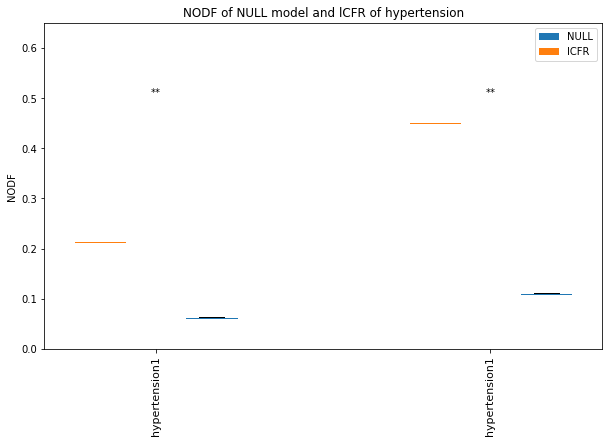

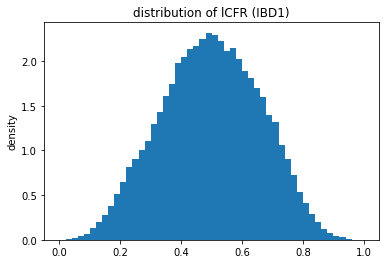

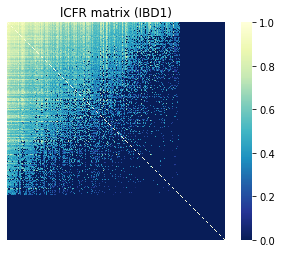

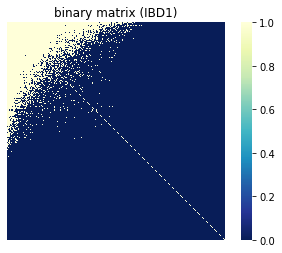

IBD1 NODF = 0.3018563984097464


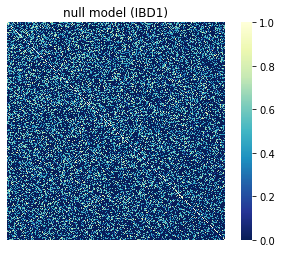

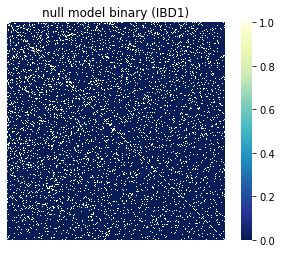

IBD1 last null model NODF = 0.10162238770440497
IBD1 p value = 2.430797595116147e-272


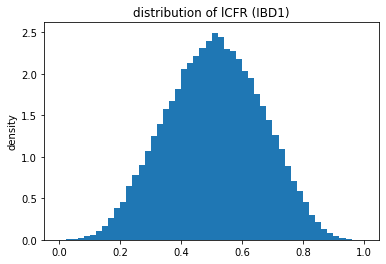

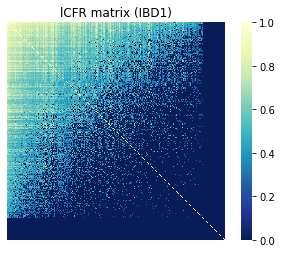

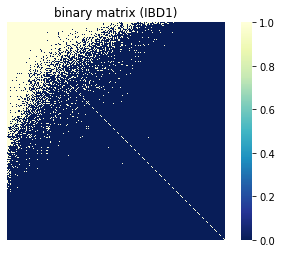

IBD1 NODF = 0.4376374787095882


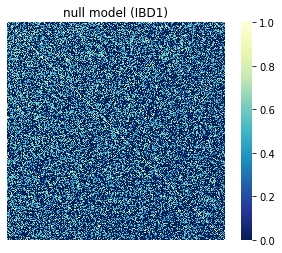

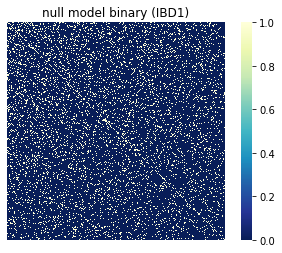

IBD1 last null model NODF = 0.12891254272634722
IBD1 p value = 4.874761810775961e-285


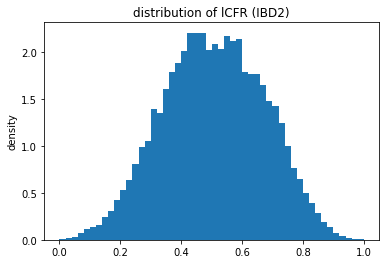

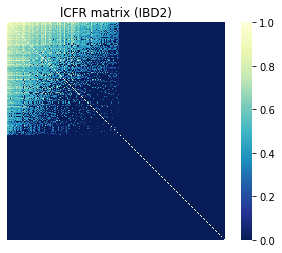

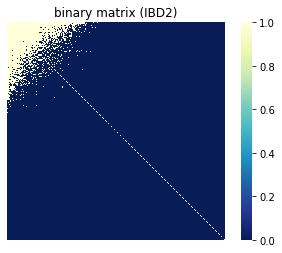

IBD2 NODF = 0.12922178516630803


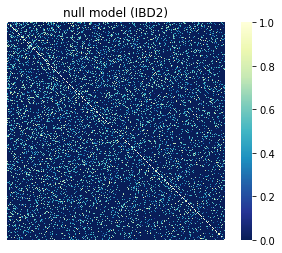

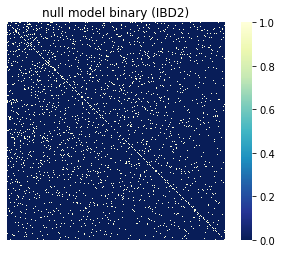

IBD2 last null model NODF = 0.05079642707271282
IBD2 p value = 3.851504224847505e-231


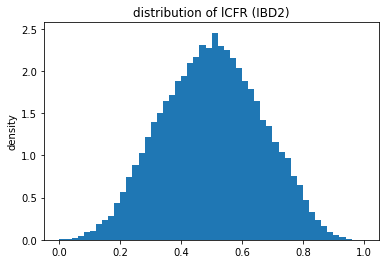

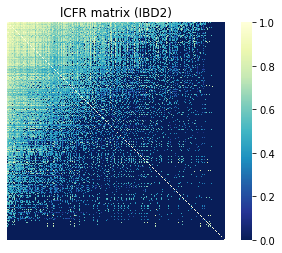

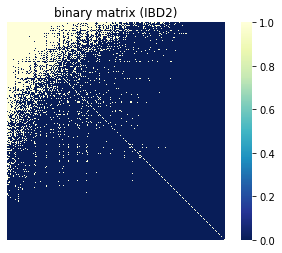

IBD2 NODF = 0.3686671523475477


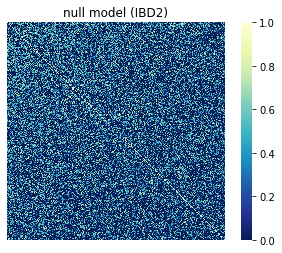

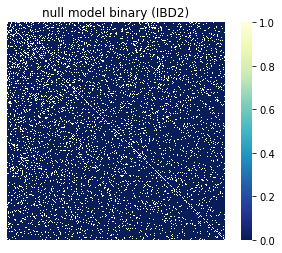

IBD2 last null model NODF = 0.11331212812184607
IBD2 p value = 8.094405580568976e-277


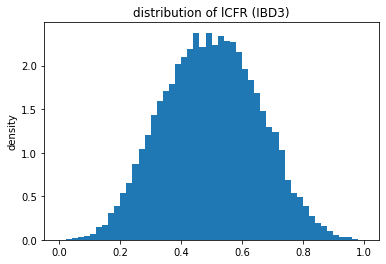

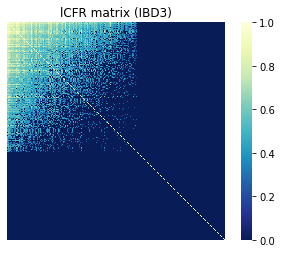

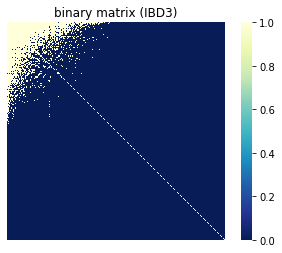

IBD3 NODF = 0.16455541280995892


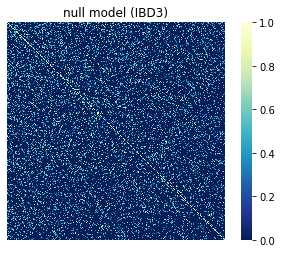

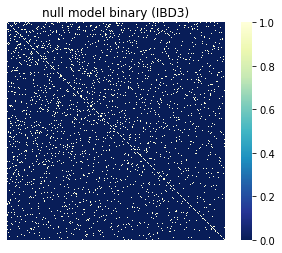

IBD3 last null model NODF = 0.05546348796906308
IBD3 p value = 2.7567016125688186e-245


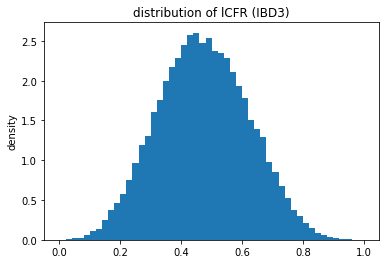

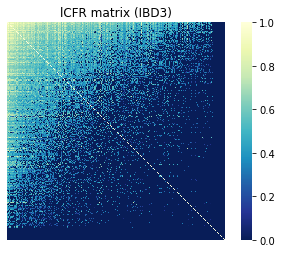

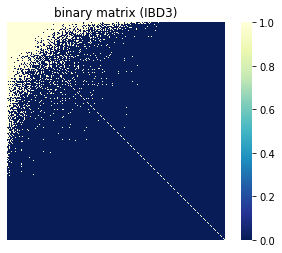

IBD3 NODF = 0.30017174697046206


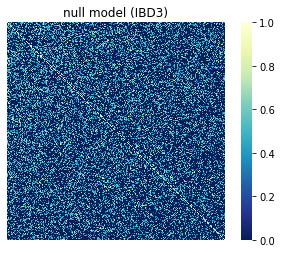

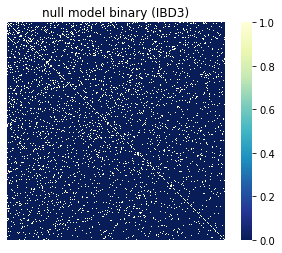

IBD3 last null model NODF = 0.07672339084304934
IBD3 p value = 1.3833102905709203e-276


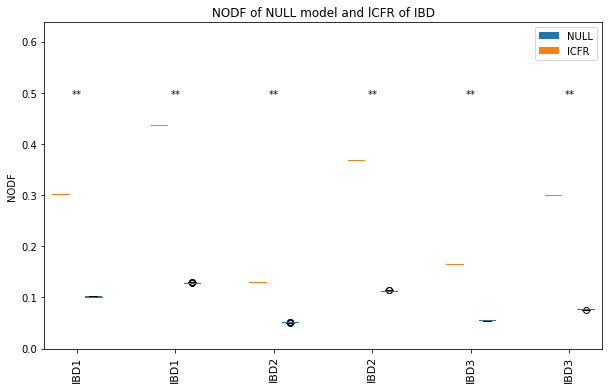

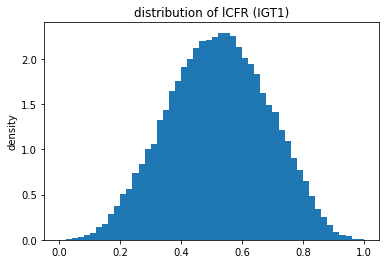

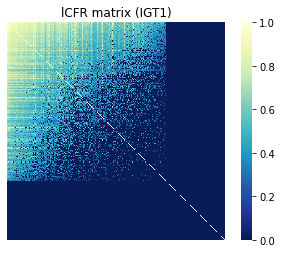

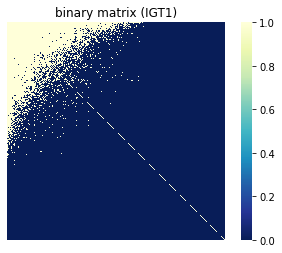

IGT1 NODF = 0.33973162448957117


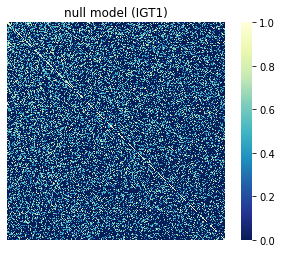

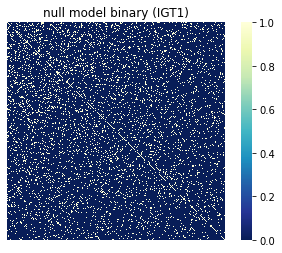

IGT1 last null model NODF = 0.1121102639130913
IGT1 p value = 1.0146660049995202e-261


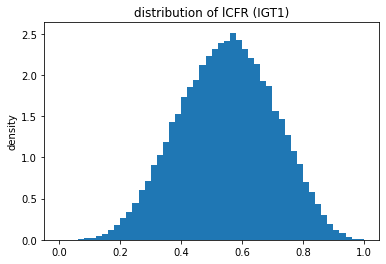

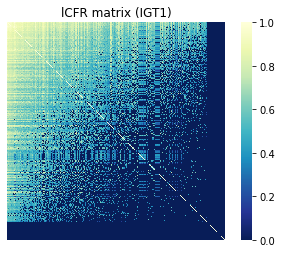

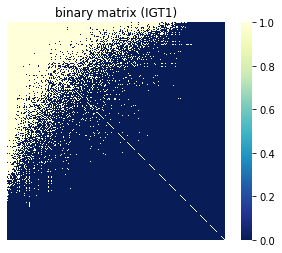

IGT1 NODF = 0.5684663702503745


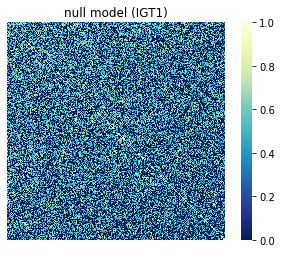

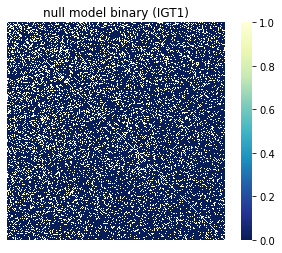

IGT1 last null model NODF = 0.19437397980171672
IGT1 p value = 1.1772969884460016e-274


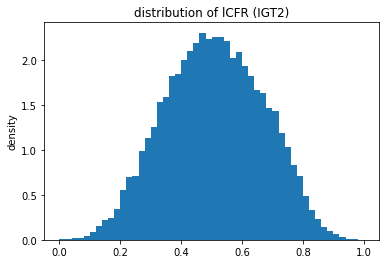

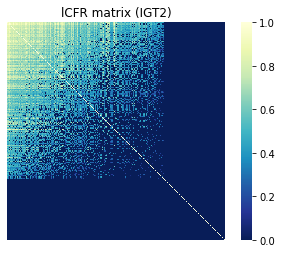

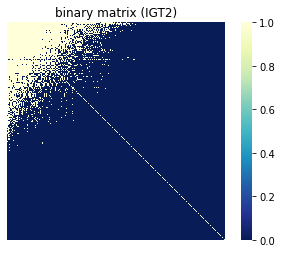

IGT2 NODF = 0.25389741167636865


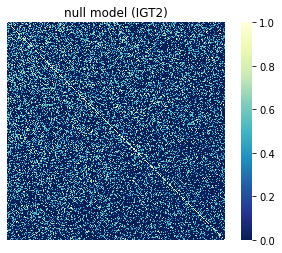

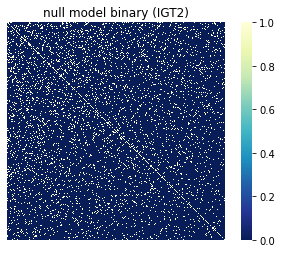

IGT2 last null model NODF = 0.09860013659237274
IGT2 p value = 4.137715001608221e-237


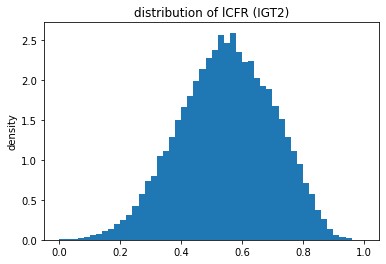

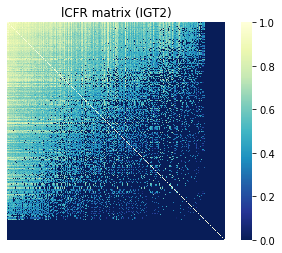

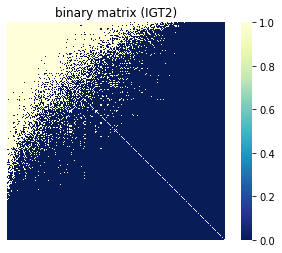

IGT2 NODF = 0.5271527821462991


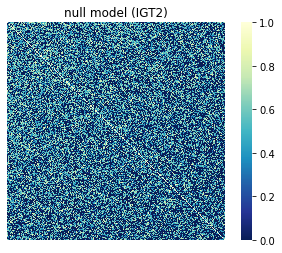

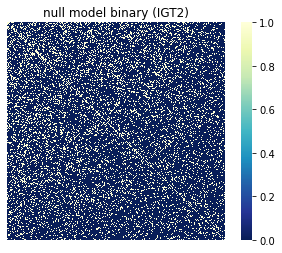

IGT2 last null model NODF = 0.19509741593984942
IGT2 p value = 1.3225817698434003e-262


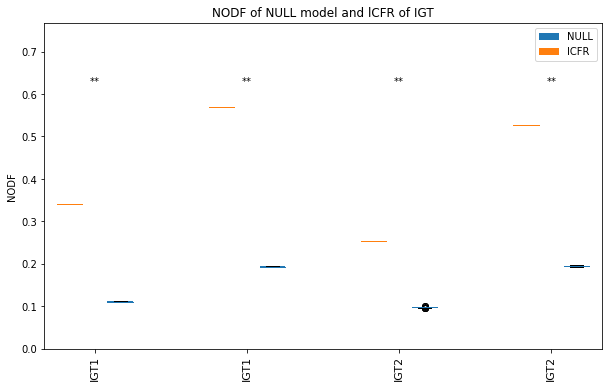

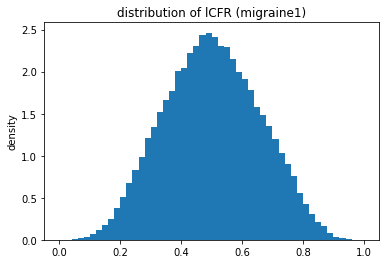

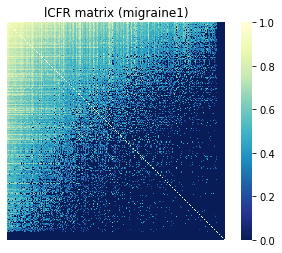

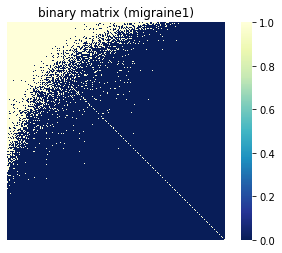

migraine1 NODF = 0.48420990190108504


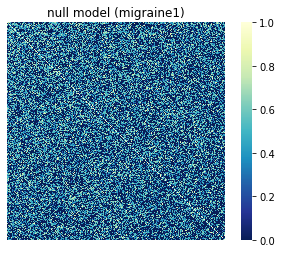

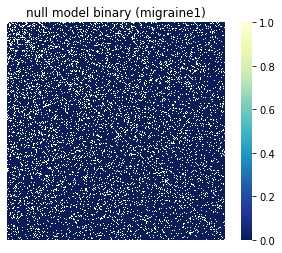

migraine1 last null model NODF = 0.13890103909696025
migraine1 p value = 1.9684834393088197e-288


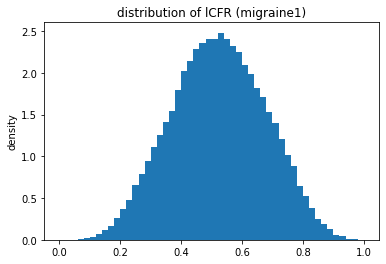

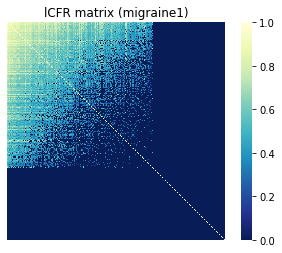

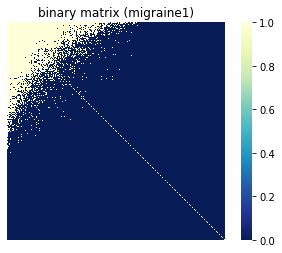

migraine1 NODF = 0.2799485081105268


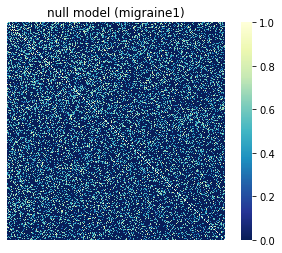

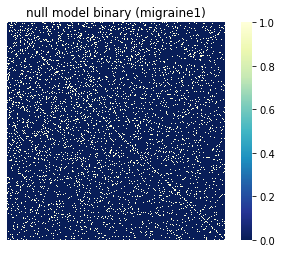

migraine1 last null model NODF = 0.0916542239711568
migraine1 p value = 6.706828195278179e-267


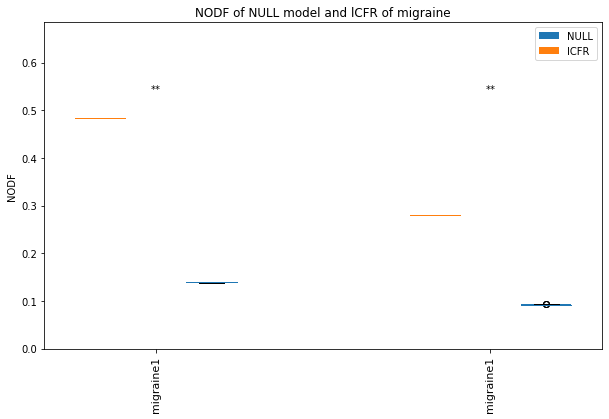

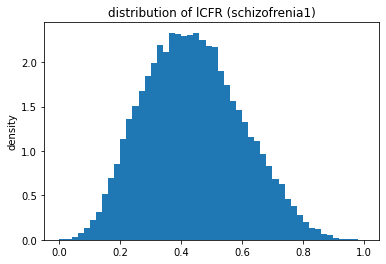

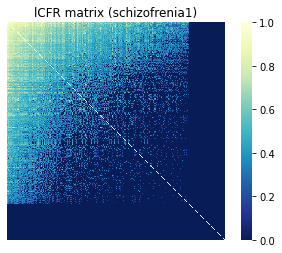

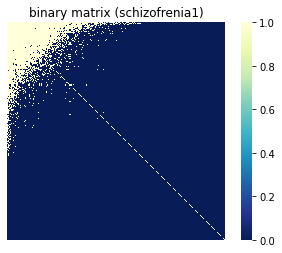

schizofrenia1 NODF = 0.2623573607744977


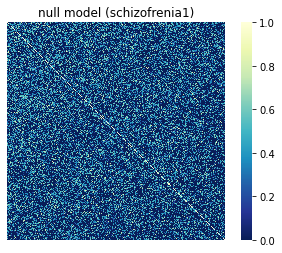

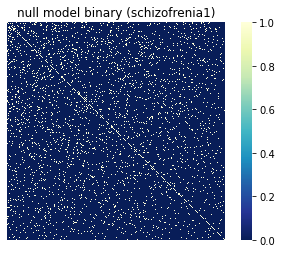

schizofrenia1 last null model NODF = 0.06589340506871823
schizofrenia1 p value = 6.834343759486786e-266


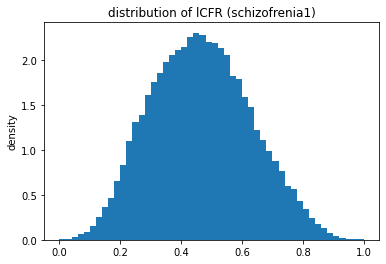

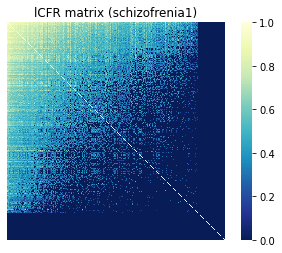

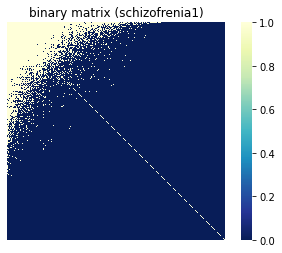

schizofrenia1 NODF = 0.3546933285177764


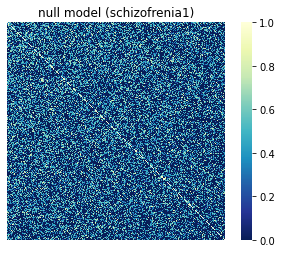

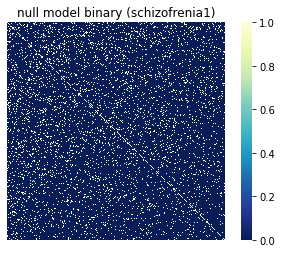

schizofrenia1 last null model NODF = 0.09780872624283231
schizofrenia1 p value = 7.195616082847829e-270


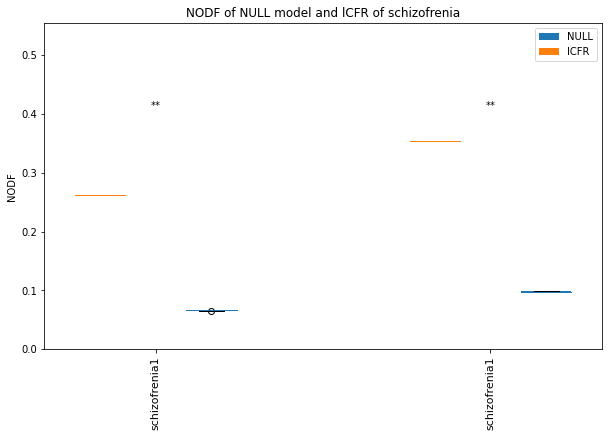

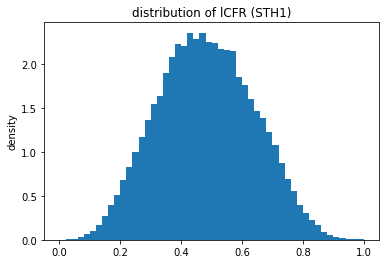

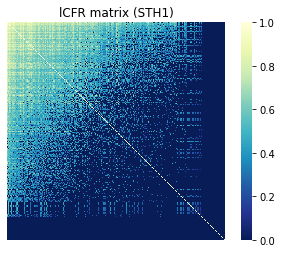

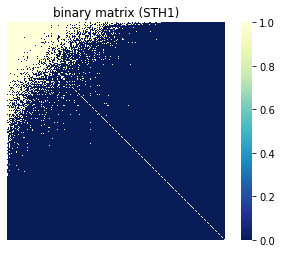

STH1 NODF = 0.32002963637547255


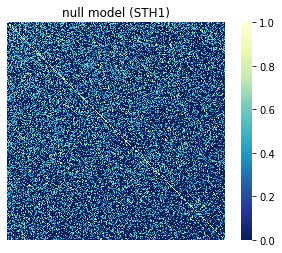

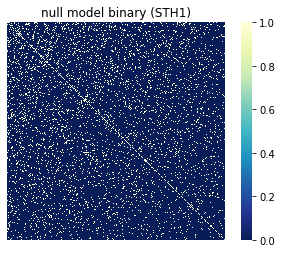

STH1 last null model NODF = 0.09555899812920263
STH1 p value = 1.4618852046381571e-249


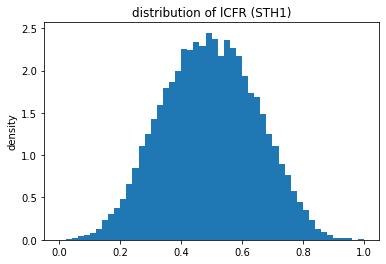

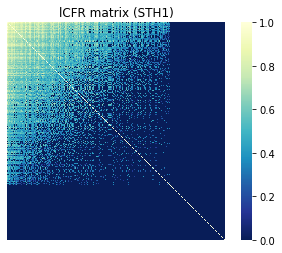

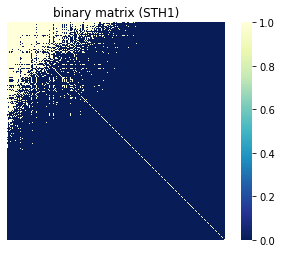

STH1 NODF = 0.23095571106948476


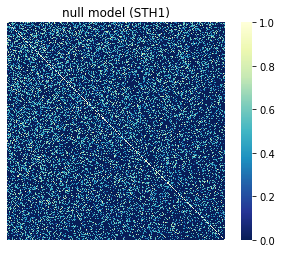

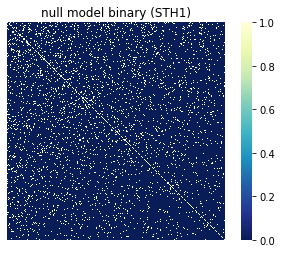

STH1 last null model NODF = 0.07706188663883848
STH1 p value = 1.163334078157327e-242


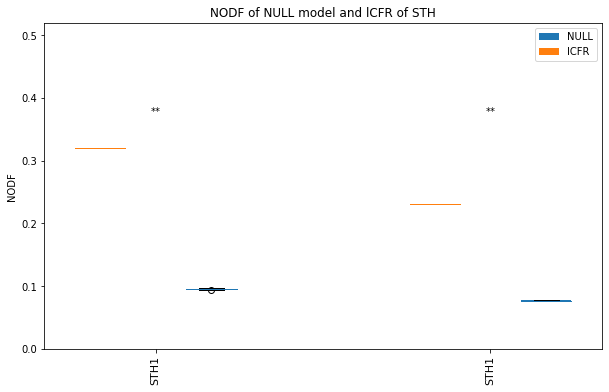

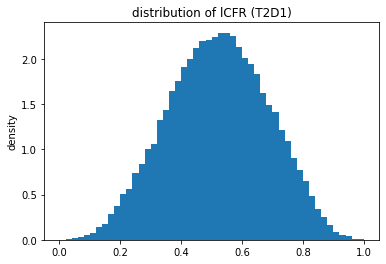

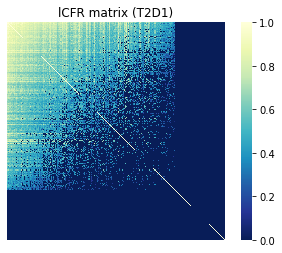

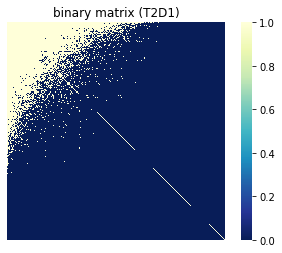

T2D1 NODF = 0.38033517212052137


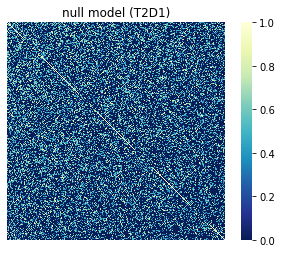

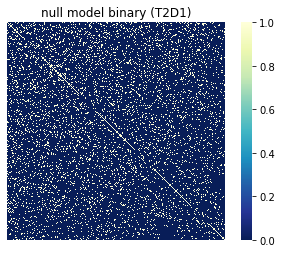

T2D1 last null model NODF = 0.12520579971914567
T2D1 p value = 3.550306601093475e-265


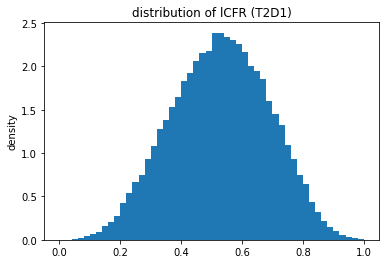

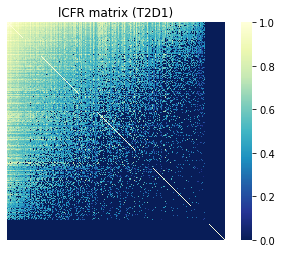

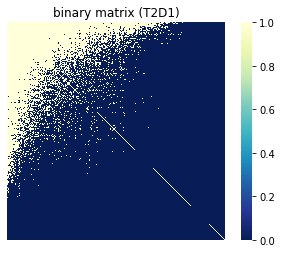

T2D1 NODF = 0.513650962943826


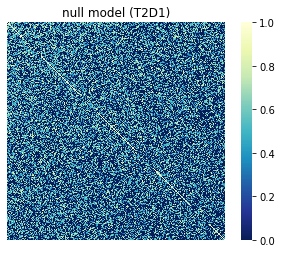

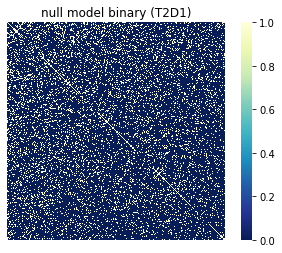

T2D1 last null model NODF = 0.1671224294808362
T2D1 p value = 2.1152978032301603e-277


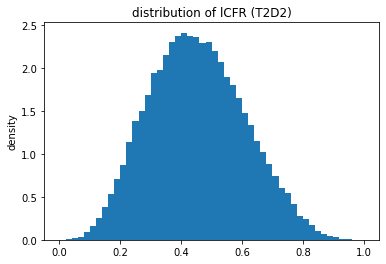

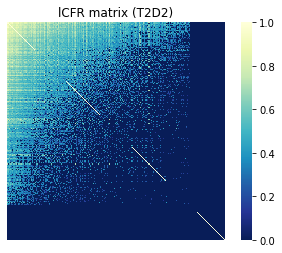

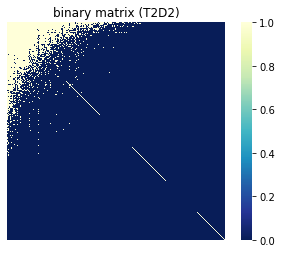

T2D2 NODF = 0.2484735169922189


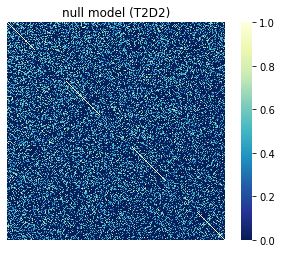

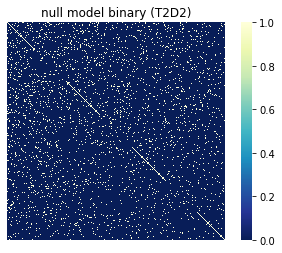

T2D2 last null model NODF = 0.06254653941124287
T2D2 p value = 5.495749458894466e-282


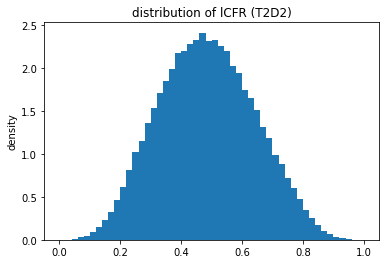

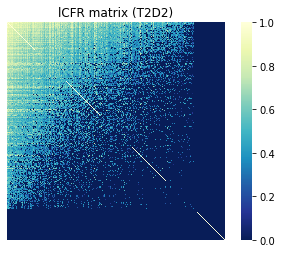

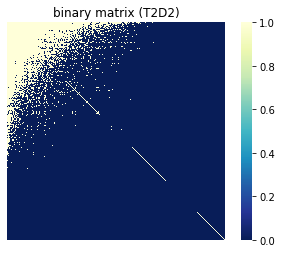

T2D2 NODF = 0.32984074083230946


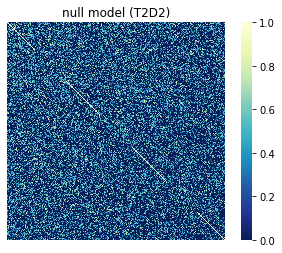

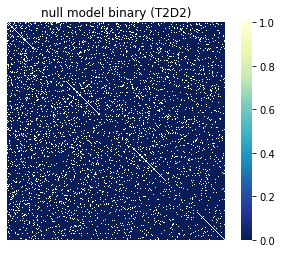

T2D2 last null model NODF = 0.09343194650640592
T2D2 p value = 1.9336974734688532e-280


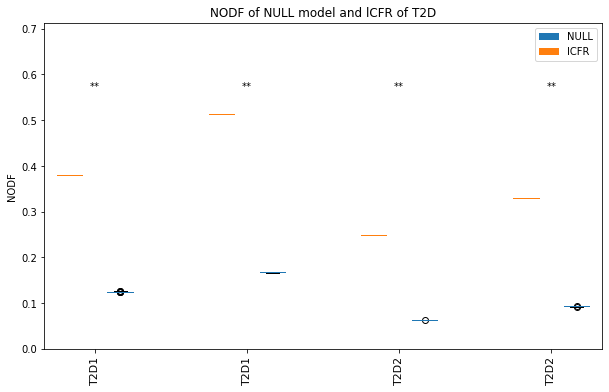

In [3]:

for disease in fr_dict.keys():
    empty_all = []
    nestedness_all = []
    p_list = []
    labels = []
    for cohort in fr_dict[disease].keys():
        for pheno in fr_dict[disease][cohort].keys():
            current_label = '{}'.format(cohort)
            scores, nested_nodf_score, p = nestedness(fr_dict[disease][cohort][pheno], current_label)
            empty_all.append(scores)
            nestedness_all.append(nested_nodf_score)
            p_list.append(p)
            labels.append(current_label)
    nested = [[x] for x in nestedness_all]
    x1 = list(range(1, len(p_list)*3, 3))
    x2 = [x+1 for x in x1]
    max_y = max(nestedness_all)
    plt.figure(figsize=(10, 6))
    box1 = plt.boxplot(empty_all,positions=x2, patch_artist=True, 
                boxprops={"facecolor": "C0",
                        "edgecolor": "C0",
                        "linewidth": 0},
                medianprops={"color": "C0", "linewidth": 1})
    box2 = plt.boxplot(nested,positions=x1, patch_artist=True, 
                boxprops={"facecolor": "C1",
                        "edgecolor": "C1",
                        "linewidth": 0},
                medianprops={"color": "C1", "linewidth": 1})
    lx = [(x1[i] + x2[i])/2 for i in range(len(x1))]
    plt.ylim([0, max(nestedness_all)+ 0.2])
    plt.xticks(lx,labels,fontsize=11, rotation=90)
    plt.ylabel('NODF')

    # add p value
    for i, x in enumerate(lx):
        p = p_list[i]
        if p < 0.01:
            mark = '**'
        elif p < 0.05:
            mark = '*'
        else:
            mark = ''
        plt.text(x, max_y + 0.05, mark, ha='center', va='bottom', fontsize=10)

    plt.legend(handles=[box1['boxes'][0],box2['boxes'][0]],labels=['NULL','lCFR'], loc=1)
    plt.title('NODF of NULL model and lCFR of {}'.format(pheno))
    plt.show()
    